In [2]:
import pandas as pd
import numpy as np
import sqlite3
import plotly.express as px
import plotly.graph_objects as go


In [4]:
import sqlite3
import pandas as pd

conn = sqlite3.connect("traffic.db")
tables = pd.read_sql_query(
    "SELECT name FROM sqlite_master WHERE type='table';",
    conn
)
conn.close()

tables


,name
0,SF_snapshots
1,AC_snapshots


In [5]:
import sqlite3
import pandas as pd

conn = sqlite3.connect("traffic.db")
traffic = pd.read_sql_query("SELECT * FROM SF_snapshots", conn)
conn.close()

traffic.head()
traffic.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1596708 entries, 0 to 1596707
Data columns (total 9 columns):
 #   Column               Non-Null Count    Dtype  
---  ------               --------------    -----  
 0   timestamp_retrieved  1596708 non-null  object 
 1   ts_unix              1596708 non-null  int64  
 2   lat                  1596708 non-null  float64
 3   lon                  1596708 non-null  float64
 4   speed_kmh            1596708 non-null  float64
 5   bearing              1596708 non-null  float64
 6   route_id             1596708 non-null  object 
 7   vehicle_id           1596708 non-null  object 
 8   agency               1596708 non-null  object 
dtypes: float64(4), int64(1), object(4)
memory usage: 109.6+ MB


In [15]:
# Convertir timestamp a datetime real
traffic['timestamp_retrieved'] = pd.to_datetime(traffic['timestamp_retrieved'])

# Crear columna de 'Hora' para agregaciones
traffic['hour'] = traffic['timestamp_retrieved'].dt.hour

# Opcional: Tomar una muestra si el renderizado es lento (ej. 10%)
# df_vis = traffic.sample(frac=0.1)
df_vis = traffic.copy()

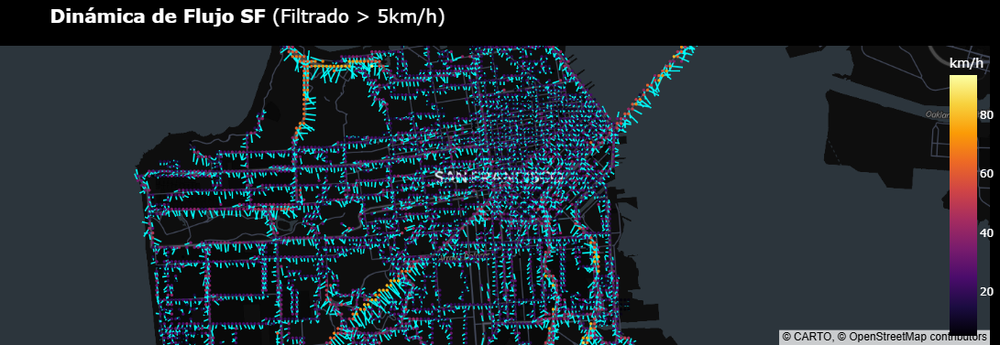

In [12]:
import pandas as pd
import numpy as np
import plotly.graph_objects as go

# --- 1. LIMPIEZA Y FILTRADO (CRUCIAL PARA QUE NO SEA UN CAOS) ---
df = traffic.copy()

# FILTRO PRO: Solo mostramos movimiento real (> 5 km/h).
# Esto elimina el "ruido" de buses parados que ensucian el mapa.
df = df[df['speed_kmh'] > 5]

# --- 2. AGREGACIÓN (GRID) ---
# Redondeamos a 3 decimales (~100m) para agrupar
df['lat_bin'] = df['lat'].round(3)
df['lon_bin'] = df['lon'].round(3)

# Promediamos vectores por celda
grid = df.groupby(['lat_bin', 'lon_bin']).agg({
    'speed_kmh': 'mean',
    'bearing': 'mean'
}).reset_index()

# --- 3. MATEMÁTICAS DE VECTORES AJUSTADAS ---
grid['rads'] = np.radians(90 - grid['bearing'])

# *** CORRECCIÓN DE ESCALA ***
# Antes era 0.0005 (demasiado grande). Lo bajamos 10 veces.
scale_factor = 0.00005 

grid['delta_lon'] = np.cos(grid['rads']) * grid['speed_kmh'] * scale_factor
grid['delta_lat'] = np.sin(grid['rads']) * grid['speed_kmh'] * scale_factor

# --- 4. PREPARACIÓN DE LÍNEAS (INTERLEAVING) ---
start_lats = grid['lat_bin'].values
start_lons = grid['lon_bin'].values
end_lats = start_lats + grid['delta_lat'].values
end_lons = start_lons + grid['delta_lon'].values

empty = np.full(len(grid), None)
lats_lines = np.column_stack((start_lats, end_lats, empty)).flatten()
lons_lines = np.column_stack((start_lons, end_lons, empty)).flatten()

# --- 5. VISUALIZACIÓN MODERNA (SIN WARNINGS) ---
fig = go.Figure()

# Capa 1: Vectores (Flechas de flujo)
fig.add_trace(go.Scattermap( # CAMBIO: Scattermap en vez de Scattermapbox
    lat=lats_lines,
    lon=lons_lines,
    mode='lines',
    line=dict(width=1.5, color='#00ffff'), # Cyan más fino
    hoverinfo='skip',
    name='Flujo'
))

# Capa 2: Puntos de calor (Intensidad)
fig.add_trace(go.Scattermap( # CAMBIO: Scattermap
    lat=grid['lat_bin'],
    lon=grid['lon_bin'],
    mode='markers',
    marker=dict(
        size=4, # Puntos más discretos
        color=grid['speed_kmh'],
        colorscale='Inferno',
        showscale=True,
        colorbar=dict(
            title="km/h", 
            x=0.95,
            title_font=dict(color='white'),
            tickfont=dict(color='white')
        )
    ),
    text=grid['speed_kmh'].round(1).astype(str) + ' km/h',
    hoverinfo='text',
    name='Velocidad'
))

# Layout limpio y oscuro
fig.update_layout(
    title=dict(
        text="<b>Dinámica de Flujo SF</b> (Filtrado > 5km/h)",
        font=dict(color='white', size=20)
    ),
    # CAMBIO: Sintaxis nueva de mapas de Plotly
    map=dict(
        style="dark", # Estilo nativo oscuro
        center=dict(lat=37.7749, lon=-122.4194),
        zoom=11.5
    ),
    paper_bgcolor='black', # Fondo de la app negro
    margin={"r":0,"t":50,"l":0,"b":0},
    showlegend=False
)

fig.show()

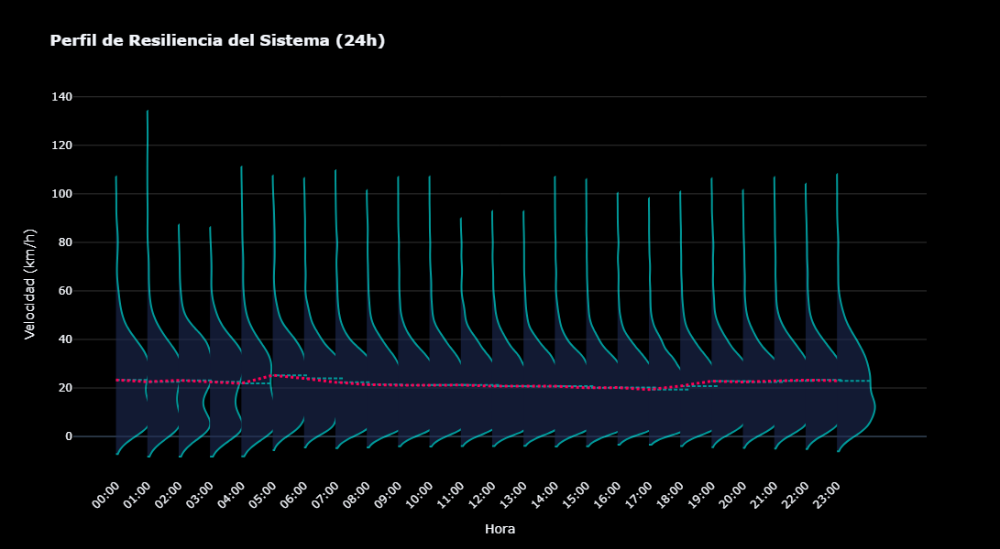

In [15]:
import pandas as pd
import plotly.graph_objects as go

# --- 1. PREPARACIÓN (Igual que antes) ---
df_temporal = traffic.copy()
df_temporal['timestamp_retrieved'] = pd.to_datetime(df_temporal['timestamp_retrieved'])
df_temporal['hour'] = df_temporal['timestamp_retrieved'].dt.hour
df_temporal = df_temporal[df_temporal['speed_kmh'] > 1] 

# Sampleamos para rendimiento
if len(df_temporal) > 50000:
    df_vis = df_temporal.sample(n=50000, random_state=42)
else:
    df_vis = df_temporal

# --- 2. GENERACIÓN DE ETIQUETAS DE HORA ---
# Creamos una lista del 0 al 23
hours_numeric = list(range(24))
# Creamos una lista de textos: "00:00", "01:00", ... "23:00"
hours_label = [f"{h:02d}:00" for h in hours_numeric]

# --- 3. VISUALIZACIÓN ---
fig = go.Figure()

fig.add_trace(go.Violin(
    x=df_vis['hour'],
    y=df_vis['speed_kmh'],
    line_color='#00ffff',
    fillcolor='#1f2c56',
    opacity=0.6,
    meanline_visible=True,
    points=False,
    side='positive',
    width=3,
    name='Distribución'
))

# Línea de tendencia media
mean_speed = df_vis.groupby('hour')['speed_kmh'].mean()
fig.add_trace(go.Scatter(
    x=mean_speed.index,
    y=mean_speed.values,
    mode='lines',
    line=dict(color='#ff0055', width=3, dash='dot'),
    name='Velocidad Media'
))

# --- 4. FORMATO EJE X CORREGIDO ---
fig.update_layout(
    title="<b>Perfil de Resiliencia del Sistema (24h)</b>",
    xaxis_title="Hora",
    yaxis_title="Velocidad (km/h)",
    xaxis=dict(
        tickmode='array',      # Le decimos a Plotly "usa mis etiquetas manuales"
        tickvals=hours_numeric, # Dónde poner la etiqueta (0, 1, 2...)
        ticktext=hours_label,   # Qué texto poner ("00:00", "01:00"...)
        tickangle=-45,          # Un poco inclinado para estilo moderno
        showgrid=False
    ),
    yaxis=dict(showgrid=True, gridcolor='#333'),
    template='plotly_dark',
    plot_bgcolor='black',
    paper_bgcolor='black',
    showlegend=False,
    height=600
)

fig.show()

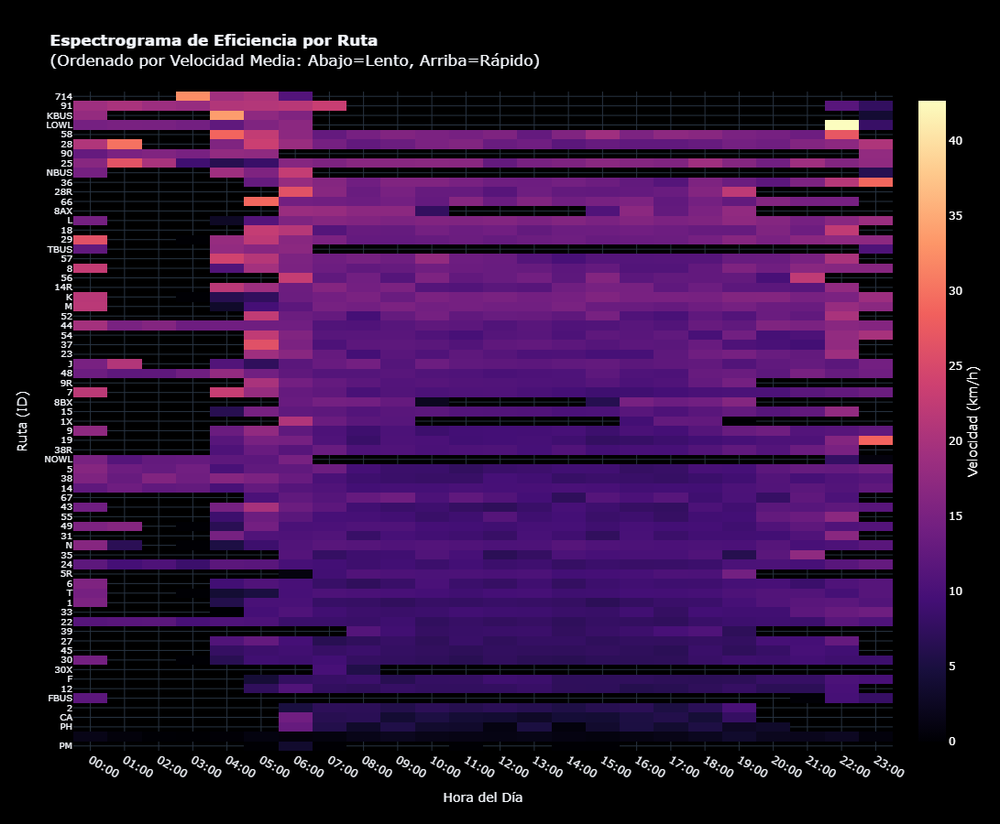

In [16]:
import pandas as pd
import plotly.graph_objects as go

# --- 1. INGENIERÍA DE DATOS ---
df_matrix = traffic.copy()
df_matrix['timestamp_retrieved'] = pd.to_datetime(df_matrix['timestamp_retrieved'])
df_matrix['hour'] = df_matrix['timestamp_retrieved'].dt.hour

# Agregamos: Velocidad promedio por Ruta y Hora
pivot_data = df_matrix.groupby(['route_id', 'hour'])['speed_kmh'].mean().reset_index()

# Convertimos a formato Matriz (Pivot Table)
# Filas: Rutas, Columnas: Horas, Valores: Velocidad
matrix = pivot_data.pivot(index='route_id', columns='hour', values='speed_kmh')

# --- 2. ORDENAMIENTO INTELIGENTE (CLUSTERING VISUAL SIMPLE) ---
# Calculamos la velocidad media total de cada ruta para ordenar el eje Y
# Esto pone las rutas más lentas (congstión crónica) abajo y las rápidas arriba
route_mean_speed = matrix.mean(axis=1).sort_values(ascending=True)
matrix_sorted = matrix.reindex(route_mean_speed.index)

# --- 3. VISUALIZACIÓN DE ESPECTROGRAMA ---
fig = go.Figure(data=go.Heatmap(
    z=matrix_sorted.values,
    x=[f"{h:02d}:00" for h in matrix_sorted.columns], # Formato de hora legible
    y=matrix_sorted.index,
    colorscale='Magma', # Magma va de Negro (lento) a Brillante (rápido)
    colorbar=dict(
        title='Velocidad (km/h)',
        title_side='right',
        tickfont=dict(color='white'),
        title_font=dict(color='white')
    )
))

fig.update_layout(
    title="<b>Espectrograma de Eficiencia por Ruta</b><br>(Ordenado por Velocidad Media: Abajo=Lento, Arriba=Rápido)",
    xaxis_title="Hora del Día",
    yaxis_title="Ruta (ID)",
    template='plotly_dark',
    plot_bgcolor='black',
    paper_bgcolor='black',
    height=900, # Alto para que quepan todas las rutas
    yaxis=dict(
        tickmode='linear',
        dtick=1, # Mostrar todas las etiquetas si hay espacio, o ajustar si son muchas
        tickfont=dict(size=10)
    )
)

fig.show()

C:\Users\ricar\AppData\Local\Temp\ipykernel_27708\855985735.py:27: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



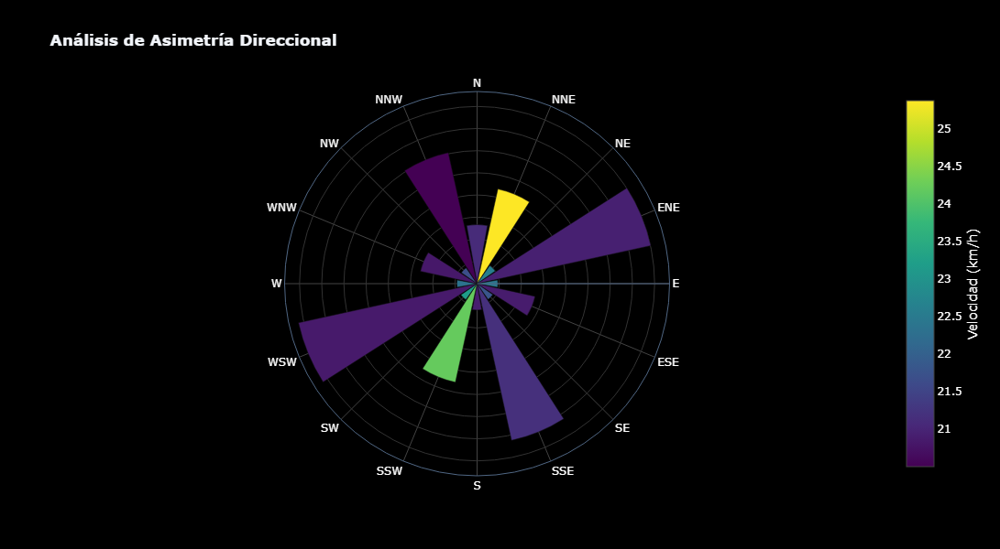

In [18]:
import pandas as pd
import numpy as np
import plotly.graph_objects as go

# --- 1. INGENIERÍA DE FEATURES ---
df_polar = traffic.copy()

# Filtramos buses parados
df_polar = df_polar[df_polar['speed_kmh'] > 1]

# Definimos los cortes (17 bordes para 16 sectores)
bins = np.linspace(0, 360, 17)
labels = ["N", "NNE", "NE", "ENE", "E", "ESE", "SE", "SSE", 
          "S", "SSW", "SW", "WSW", "W", "WNW", "NW", "NNW"]

# --- CORRECCIÓN AQUÍ ---
# Usamos 'bins' completo. NO uses bins[:-1]
# include_lowest=True asegura que el grado 0 exacto sea incluido.
df_polar['cardinal_direction'] = pd.cut(
    df_polar['bearing'], 
    bins=bins, 
    labels=labels, 
    include_lowest=True
)

# Agregamos los datos
polar_data = df_polar.groupby('cardinal_direction').agg(
    frequency=('vehicle_id', 'count'),
    mean_speed=('speed_kmh', 'mean')
).reset_index()

# --- 2. VISUALIZACIÓN POLAR ---
fig = go.Figure()

fig.add_trace(go.Barpolar(
    r=polar_data['frequency'],     
    theta=polar_data['cardinal_direction'], 
    marker=dict(
        color=polar_data['mean_speed'],     
        colorscale='Viridis',               
        showscale=True,
        colorbar=dict(
            title='Velocidad (km/h)',
            title_side='right',
            tickfont=dict(color='white'),
            title_font=dict(color='white')
        )
    ),
    name='Dirección'
))

fig.update_layout(
    title="<b>Análisis de Asimetría Direccional</b>",
    template='plotly_dark',
    paper_bgcolor='black',
    polar=dict(
        bgcolor='black',
        radialaxis=dict(visible=True, showticklabels=False, gridcolor='#333'),
        angularaxis=dict(
            tickfont=dict(color='white'),
            rotation=90,
            direction="clockwise",
            gridcolor='#444'
        )
    ),
    showlegend=False,
    height=600
)

fig.show()

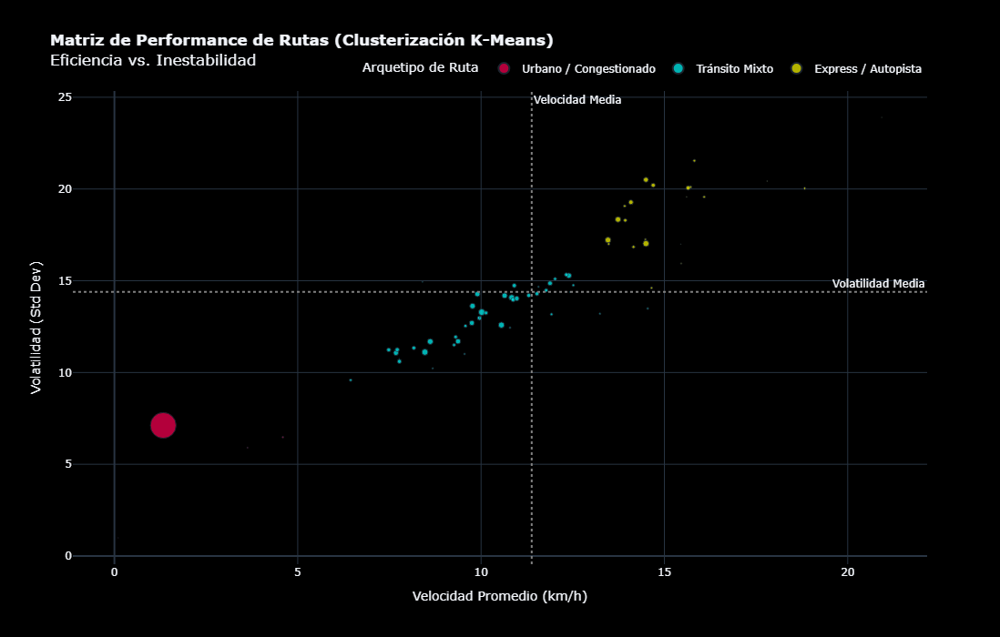

In [19]:
import pandas as pd
import plotly.express as px
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

# --- 1. INGENIERÍA DE FEATURES (PERFILADO DE RUTAS) ---
route_profile = traffic.groupby('route_id').agg(
    avg_speed=('speed_kmh', 'mean'),
    volatility=('speed_kmh', 'std'), # Desviación estándar = Incertidumbre
    data_points=('vehicle_id', 'count') # Proxy de frecuencia/tamaño de flota
).reset_index()

# Limpieza: Eliminamos rutas con NaN (si hay alguna con 1 solo dato)
route_profile = route_profile.dropna()

# --- 2. MODELADO ML (K-MEANS) ---
# Normalizamos los datos porque la varianza y la media tienen escalas diferentes
scaler = StandardScaler()
features = route_profile[['avg_speed', 'volatility']]
features_scaled = scaler.fit_transform(features)

# Aplicamos K-Means (Buscamos 3 clústeres lógicos: Lento, Rápido, Caótico)
kmeans = KMeans(n_clusters=3, random_state=42, n_init=10)
route_profile['cluster'] = kmeans.fit_predict(features_scaled)
route_profile['cluster'] = route_profile['cluster'].astype(str) # Para que Plotly lo trate como discreto

# --- 3. ETIQUETADO DE CLÚSTERES (INTERPRETACIÓN AUTOMÁTICA) ---
# Esto es un truco para saber cuál es cuál sin mirar la gráfica primero
cluster_centers = route_profile.groupby('cluster')['avg_speed'].mean().sort_values()
# Asignamos nombres basados en la velocidad promedio del cluster
label_map = {
    cluster_centers.index[0]: 'Urbano / Congestionado',
    cluster_centers.index[1]: 'Tránsito Mixto',
    cluster_centers.index[2]: 'Express / Autopista'
}
route_profile['cluster_label'] = route_profile['cluster'].map(label_map)

# --- 4. VISUALIZACIÓN ESTRATÉGICA ---
fig = px.scatter(
    route_profile,
    x="avg_speed",
    y="volatility",
    color="cluster_label",
    size="data_points", # Tamaño burbuja = Volumen de datos capturados
    hover_name="route_id",
    title="<b>Matriz de Performance de Rutas (Clusterización K-Means)</b><br>Eficiencia vs. Inestabilidad",
    labels={
        "avg_speed": "Velocidad Promedio (km/h)",
        "volatility": "Volatilidad (Std Dev)",
        "cluster_label": "Arquetipo de Ruta"
    },
    color_discrete_map={
        'Urbano / Congestionado': '#ff0055', # Rojo Neón (Problema)
        'Tránsito Mixto': '#00ffff',         # Cyan (Standard)
        'Express / Autopista': '#ffff00'     # Amarillo (Rápido)
    },
    template='plotly_dark'
)

# Añadimos líneas medias para dividir en cuadrantes
fig.add_hline(y=route_profile['volatility'].mean(), line_dash="dot", line_color="gray", annotation_text="Volatilidad Media")
fig.add_vline(x=route_profile['avg_speed'].mean(), line_dash="dot", line_color="gray", annotation_text="Velocidad Media")

fig.update_layout(
    paper_bgcolor='black',
    plot_bgcolor='black',
    height=700,
    legend=dict(
        orientation="h",
        yanchor="bottom",
        y=1.02,
        xanchor="right",
        x=1
    )
)

fig.show()

In [21]:
import pandas as pd
import numpy as np
import plotly.graph_objects as go

# --- 1. MOTOR DE CÁLCULO FÍSICO (TELEMÁTICA) ---
df_telematics = traffic.copy()

# Ordenamos estrictamente para poder calcular diferenciales
df_telematics = df_telematics.sort_values(by=['vehicle_id', 'ts_unix'])

# Agrupamos por vehículo para no calcular diferencias entre dos buses distintos
# Usamos 'diff' vectorizado de Pandas que es muy rápido
g = df_telematics.groupby('vehicle_id')
df_telematics['dt'] = g['ts_unix'].diff() # Delta tiempo (segundos)
df_telematics['dv'] = g['speed_kmh'].diff() / 3.6 # Delta velocidad (m/s) - Ojo: convertir km/h a m/s

# Calculamos Aceleración (m/s^2)
# Evitamos división por cero o tiempos muy grandes (gaps de señal)
df_telematics = df_telematics[ (df_telematics['dt'] > 0) & (df_telematics['dt'] < 60) ]
df_telematics['accel_mps2'] = df_telematics['dv'] / df_telematics['dt']

# --- 2. FILTRADO DE EVENTOS CRÍTICOS (HARD BRAKING) ---
# Definimos "Frenada Brusca" como desaceleración menor a -2.5 m/s^2 
# (Es un frenazo que tira a los pasajeros de pie)
hard_braking = df_telematics[df_telematics['accel_mps2'] < -2.5]

# Limpiamos ruido extremo (GPS glitches que dan aceleraciones de -100 m/s^2)
hard_braking = hard_braking[hard_braking['accel_mps2'] > -15]

print(f"Detectados {len(hard_braking)} eventos de frenado crítico.")

# --- 3. VISUALIZACIÓN DE PUNTOS NEGROS DE SEGURIDAD ---
fig = go.Figure()

# Capa Base: Todas las frenadas (Scatter simple)
fig.add_trace(go.Scattermap(
    lat=hard_braking['lat'],
    lon=hard_braking['lon'],
    mode='markers',
    marker=dict(
        size=8,
        color=hard_braking['accel_mps2'], # Color por intensidad del frenazo
        colorscale='Reds_r', # Rojo oscuro = Frenada más violenta
        opacity=0.7,
        cmin=-6, # Ajustamos rango visual
        cmax=-2.5
    ),
    text="Frenada: " + hard_braking['accel_mps2'].round(2).astype(str) + " m/s²",
    name='Eventos de Frenado'
))

# Capa de Densidad (Heatmap) para ver donde se repiten
fig.add_trace(go.Densitymapbox(
    lat=hard_braking['lat'],
    lon=hard_braking['lon'],
    z=hard_braking['accel_mps2'].abs(), # Peso por intensidad
    radius=15,
    colorscale="Hot",
    opacity=0.5,
    name='Densidad de Riesgo'
))

fig.update_layout(
    title="<b>Mapa de Riesgo Telemático</b><br>Detección de Frenadas Bruscas (G-Forces < -0.25g)",
    map=dict(
        style="dark",
        center=dict(lat=37.7749, lon=-122.4194),
        zoom=12
    ),
    paper_bgcolor='black',
    font=dict(color='white'),
    margin={"r":0,"t":50,"l":0,"b":0},
    showlegend=False
)

fig.show()

Detectados 1 eventos de frenado crítico.


C:\Users\ricar\AppData\Local\Temp\ipykernel_27708\643064939.py:53: DeprecationWarning:

*densitymapbox* is deprecated! Use *densitymap* instead. Learn more at: https://plotly.com/python/mapbox-to-maplibre/



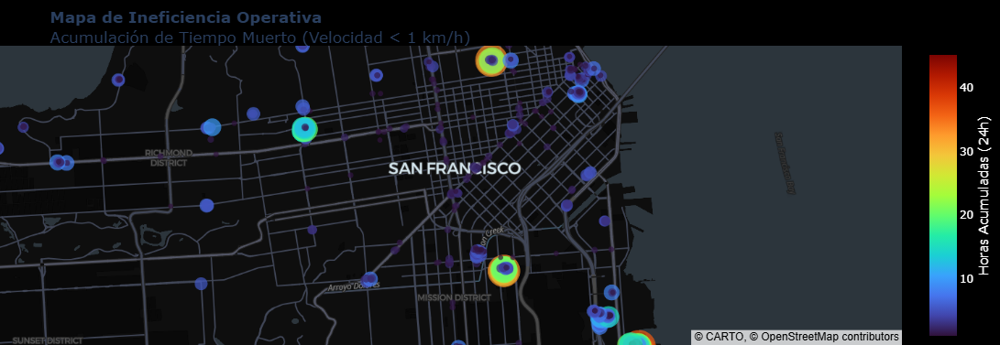

In [22]:
import pandas as pd
import plotly.graph_objects as go

# --- 1. LÓGICA DE NEGOCIO (Detectar Tiempo Perdido) ---
df_idle = traffic.copy()

# Ordenar es vital para calcular deltas de tiempo
df_idle = df_idle.sort_values(by=['vehicle_id', 'ts_unix'])
df_idle['dt'] = df_idle.groupby('vehicle_id')['ts_unix'].diff()

# FILTRO DE "TIEMPO MUERTO":
# 1. El vehículo está casi parado (< 1 km/h)
# 2. El salto de tiempo es razonable (< 300s) para evitar saltos de apagado de motor
idle_events = df_idle[ (df_idle['speed_kmh'] < 1) & (df_idle['dt'] < 300) & (df_idle['dt'] > 0) ].copy()

# --- 2. AGREGACIÓN ESPACIAL (GRID) ---
# Redondeamos lat/lon a 4 decimales (~11 metros, tamaño de un bus)
# Esto agrupa todos los pings de un mismo semáforo/parada
idle_events['lat_bin'] = idle_events['lat'].round(4)
idle_events['lon_bin'] = idle_events['lon'].round(4)

# Sumamos los segundos perdidos en cada punto geográfico
idle_hotspots = idle_events.groupby(['lat_bin', 'lon_bin']).agg(
    total_idle_seconds=('dt', 'sum'),
    stop_count=('vehicle_id', 'count')
).reset_index()

# Convertimos a Horas para que el número sea legible por humanos
idle_hotspots['total_idle_hours'] = idle_hotspots['total_idle_seconds'] / 3600

# Filtramos puntos irrelevantes (menos de 1 hora acumulada en 24h)
idle_hotspots = idle_hotspots[idle_hotspots['total_idle_hours'] > 1]

# --- 3. VISUALIZACIÓN DE SUMIDEROS (BUBBLE MAP) ---
fig = go.Figure()

fig.add_trace(go.Scattermap(
    lat=idle_hotspots['lat_bin'],
    lon=idle_hotspots['lon_bin'],
    mode='markers',
    marker=dict(
        size=idle_hotspots['total_idle_hours'], # Tamaño = Horas perdidas
        sizemode='area',
        sizeref=idle_hotspots['total_idle_hours'].max() / (30**2), # Escalar burbujas
        color=idle_hotspots['total_idle_hours'],
        colorscale='Turbo', # Escala muy contrastada
        showscale=True,
        colorbar=dict(
            title="Horas Acumuladas (24h)",
            title_side="right",
            title_font=dict(color='white'),
            tickfont=dict(color='white')
        )
    ),
    text="Horas Perdidas: " + idle_hotspots['total_idle_hours'].round(1).astype(str) + "h",
    hoverinfo='text',
    name='Puntos de Espera'
))

fig.update_layout(
    title="<b>Mapa de Ineficiencia Operativa</b><br>Acumulación de Tiempo Muerto (Velocidad < 1 km/h)",
    map=dict(
        style="dark",
        center=dict(lat=37.7749, lon=-122.4194),
        zoom=12
    ),
    paper_bgcolor='black',
    margin={"r":0,"t":50,"l":0,"b":0},
    showlegend=False
)

fig.show()

Visualizando la Topología de la Ruta: 


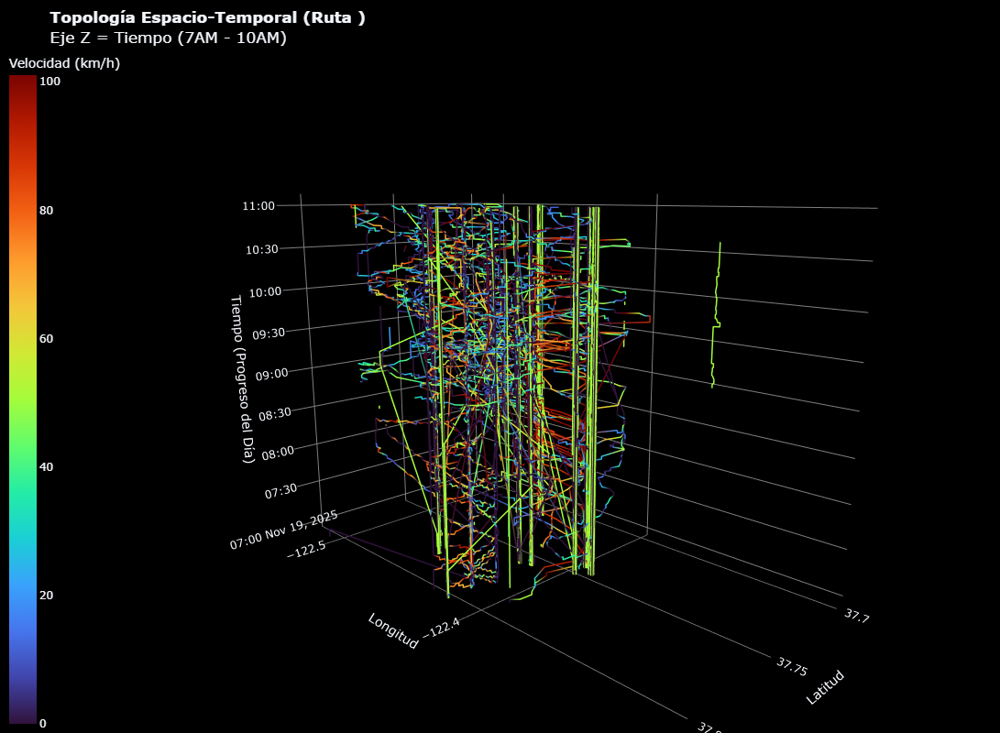

In [23]:
import pandas as pd
import plotly.graph_objects as go

# --- 1. FILTRADO INTELIGENTE (FOCUS MODE) ---
df_3d = traffic.copy()
df_3d['timestamp_retrieved'] = pd.to_datetime(df_3d['timestamp_retrieved'])

# Encontrar la ruta con más datos (la más relevante)
top_route = df_3d['route_id'].value_counts().idxmax()
print(f"Visualizando la Topología de la Ruta: {top_route}")

# Filtrar solo esa ruta y solo hora pico (ej. 07:00 a 10:00) para claridad visual
mask = (df_3d['route_id'] == top_route) & \
       (df_3d['timestamp_retrieved'].dt.hour >= 7) & \
       (df_3d['timestamp_retrieved'].dt.hour <= 10)
df_route = df_3d[mask].copy()

# Ordenar por vehículo y tiempo
df_route = df_route.sort_values(['vehicle_id', 'timestamp_retrieved'])

# --- 2. VISUALIZACIÓN 3D ---
fig = go.Figure()

# Iteramos por cada vehículo único en esa ruta para dibujar su "World Line"
# Usamos un ciclo porque queremos que cada bus sea una línea continua separada
unique_vehicles = df_route['vehicle_id'].unique()

for vehicle in unique_vehicles:
    vehicle_data = df_route[df_route['vehicle_id'] == vehicle]
    
    fig.add_trace(go.Scatter3d(
        x=vehicle_data['lat'],
        y=vehicle_data['lon'],
        z=vehicle_data['timestamp_retrieved'], # El tiempo es la altura
        mode='lines',
        line=dict(
            width=3,
            color=vehicle_data['speed_kmh'], # Color = Velocidad en ese momento
            colorscale='Turbo', # Escala muy visual
            showscale=False # Ocultamos para no repetir la barra N veces
        ),
        name=f"Bus {vehicle}",
        hoverinfo='text',
        text=f"ID: {vehicle}<br>Speed: " + vehicle_data['speed_kmh'].astype(str)
    ))

# Truco para añadir una sola Colorbar falsa (para la leyenda)
fig.add_trace(go.Scatter3d(
    x=[None], y=[None], z=[None],
    mode='markers',
    marker=dict(
        colorscale='Turbo',
        cmin=0,
        cmax=df_route['speed_kmh'].max(),
        showscale=True,
        colorbar=dict(title="Velocidad (km/h)", x=-0.1)
    ),
    showlegend=False
))

fig.update_layout(
    title=f"<b>Topología Espacio-Temporal (Ruta {top_route})</b><br>Eje Z = Tiempo (7AM - 10AM)",
    scene=dict(
        xaxis=dict(title='Latitud', backgroundcolor="black", gridcolor="gray", showbackground=True),
        yaxis=dict(title='Longitud', backgroundcolor="black", gridcolor="gray", showbackground=True),
        zaxis=dict(title='Tiempo (Progreso del Día)', backgroundcolor="black", gridcolor="gray", showbackground=True),
        camera=dict(
            eye=dict(x=1.5, y=1.5, z=0.5) # Perspectiva isométrica
        )
    ),
    template='plotly_dark',
    paper_bgcolor='black',
    margin={"r":0,"t":50,"l":0,"b":0},
    showlegend=False,
    height=800
)

fig.show()

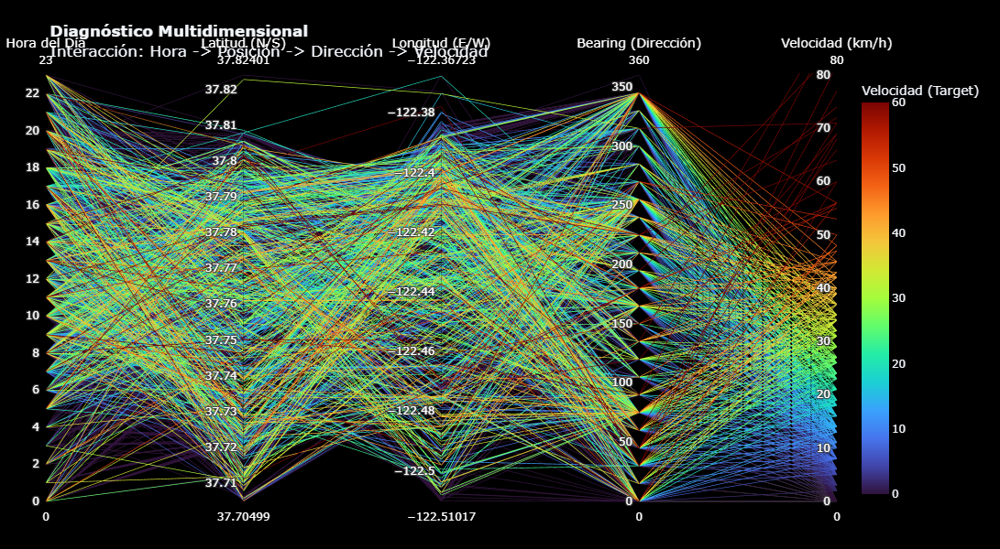

In [24]:
import pandas as pd
import plotly.graph_objects as go

# --- 1. PREPARACIÓN Y MUESTREO ---
df_parcoords = traffic.copy()
df_parcoords['timestamp_retrieved'] = pd.to_datetime(df_parcoords['timestamp_retrieved'])
df_parcoords['hour'] = df_parcoords['timestamp_retrieved'].dt.hour

# Normalizamos el Bearing para que sea continuo visualmente
# (Opcional, pero ayuda a que no salten de 360 a 0 bruscamente)
df_parcoords = df_parcoords.sort_values('hour')

# SAMPLING: Tomamos 2,000 puntos aleatorios. 
# Dibujar 1.5M de líneas en ParCoords haría el gráfico ilegible (negro total).
df_vis = df_parcoords.sample(n=2000, random_state=42)

# --- 2. VISUALIZACIÓN MULTIDIMENSIONAL ---
fig = go.Figure(data=
    go.Parcoords(
        line=dict(
            color=df_vis['speed_kmh'],
            colorscale='Turbo', # Escala muy clara para distinguir velocidades
            showscale=True,
            cmin=0,
            cmax=60,
            colorbar=dict(title='Velocidad (Target)')
        ),
        # Definimos los ejes (Dimensiones)
        dimensions=list([
            dict(range=[0, 23],
                 label='Hora del Día', values=df_vis['hour']),
            
            dict(range=[df_vis['lat'].min(), df_vis['lat'].max()],
                 label='Latitud (N/S)', values=df_vis['lat']),
            
            dict(range=[df_vis['lon'].min(), df_vis['lon'].max()],
                 label='Longitud (E/W)', values=df_vis['lon']),
            
            dict(range=[0, 360],
                 label='Bearing (Dirección)', values=df_vis['bearing']),
            
            dict(range=[0, 80],
                 label='Velocidad (km/h)', values=df_vis['speed_kmh'])
        ]),
        
        # Estilizado oscuro del componente Parcoords
        labelfont=dict(size=14, color='white'),
        tickfont=dict(size=12, color='white'),
        rangefont=dict(size=12, color='white')
    )
)

fig.update_layout(
    title="<b>Diagnóstico Multidimensional</b><br>Interacción: Hora -> Posición -> Dirección -> Velocidad",
    template='plotly_dark',
    paper_bgcolor='black',
    plot_bgcolor='black',
    height=600,
    margin={"r":50,"t":80,"l":50,"b":50}
)

fig.show()